<a href="https://colab.research.google.com/github/EmiRoberti77/YOLO11_colac/blob/main/Emi_yolo11_human_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Detect human behaviour video analytics
- author:Emiliano Roberti
- custom dataset

In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 16.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 74.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 61.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 45.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 90.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling 

In [2]:
# download dataset

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="4R5KV0K430xAvtMVIfvP")
project = rf.workspace("pose-detection-twxbg").project("human-activity-ce7zu")
version = project.version(2)
dataset = version.download("yolov8")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 89.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 88.4 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Human-activity-2 in yolov8:: 100%|██████████| 3228/3228 [00:00<00:00, 5852.98it/s]


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
import ultralytics
from ultralytics import YOLO

In [4]:
ultralytics.checks()

Ultralytics 8.3.162 🚀 Python-3.11.13 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 42.0/107.7 GB disk)


## Update the data.yaml file in the dataset folder to have the correct path to the train, valid, test folders

```yaml
test: /content/Human-activity-2/test/images
train: /content/Human-activity-2/train/images
val: /content/Human-activity-2/valid/images
```

In [6]:
# load the YOLO11 pose model
model = YOLO("yolo11s-pose.pt")

100%|██████████| 19.4M/19.4M [00:00<00:00, 147MB/s]


In [9]:
# train the model
import os
data_config_path = "/content/Human-activity-2/data.yaml"
if os.path.exists(data_config_path):
  resulst = model.train(data="/content/Human-activity-2/data.yaml", task="pose", mode="train", imgsz=640, epochs=50, batch=8)
else:
  print(f"Err:{data_config_path} not foung")

Ultralytics 8.3.162 🚀 Python-3.11.13 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Human-activity-2/data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s-pose.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pr

train: Scanning /content/Human-activity-2/train/labels.cache... 1126 images, 3 backgrounds, 3 corrupt: 100%|██████████| 1126/1126 [00:00<?, ?it/s]

train: /content/Human-activity-2/train/images/clideo_editor_3b33d792dfde4f1b8b2dd2fdf082e347_mp4-0048_jpg.rf.3d6a4188d2279fd1b429fcfa0a6ce0eb.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0005      1.0158]
train: /content/Human-activity-2/train/images/clideo_editor_3b33d792dfde4f1b8b2dd2fdf082e347_mp4-0049_jpg.rf.245067ff6f6ebf7ab9b38b346ad24ed7.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0005      1.0158]
train: /content/Human-activity-2/train/images/clideo_editor_3b33d792dfde4f1b8b2dd2fdf082e347_mp4-0050_jpg.rf.0304242590c31d28441b27bb05c37ee5.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0005      1.0158]
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, r


val: Scanning /content/Human-activity-2/valid/labels.cache... 324 images, 0 backgrounds, 0 corrupt: 100%|██████████| 324/324 [00:00<?, ?it/s]

Plotting labels to runs/pose/train3/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 87 weight(decay=0.0), 97 weight(decay=0.0005), 96 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/pose/train3
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       1/50         0G      1.818       7.02     0.5862        4.5      1.757         14        640:  11%|█         | 15/141 [05:08<43:13, 20.59s/it]


KeyboardInterrupt: 

In [10]:
# this is the model saved on drive after training
!gdown "https://drive.google.com/uc?id=1H3cfzzH9v3T9k9TNj8oaUy_sf-PH1kTA&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1H3cfzzH9v3T9k9TNj8oaUy_sf-PH1kTA&confirm=t
To: /content/best.pt
100% 20.2M/20.2M [00:00<00:00, 202MB/s]


In [17]:
# Once the model is saved in colad load the model
model = YOLO("/content/best.pt")
extentions = (".jpg",".jpeg",".png")
test_path_images = "/content/Human-activity-2/test/images"
# Get all the images in the test data directory
image_files = [os.path.join(test_path_images, img) for img in os.listdir(test_path_images) if img.endswith(extentions)]
# Predict each image
for img_path in image_files:
  results = model.predict(img_path, save=True, conf=0.25)



image 1/1 /content/Human-activity-2/test/images/clideo_editor_454ae88c0d8f4113a208876eb58e9b67_mp4-0904_jpg.rf.159a9ea6b261f9bfb415dad0d9715bd9.jpg: 640x640 1 Fall-Down, 989.3ms
Speed: 8.8ms preprocess, 989.3ms inference, 9.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/pose/predict

image 1/1 /content/Human-activity-2/test/images/clideo_editor_f6f2eab16a6a4eea8a317fab8a67542a_mp4-0382_jpg.rf.4e31b6a3ee395c47ea6820e03f6c8c36.jpg: 640x640 1 Fall-Down, 1922.6ms
Speed: 14.7ms preprocess, 1922.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/pose/predict

image 1/1 /content/Human-activity-2/test/images/clideo_editor_f6f2eab16a6a4eea8a317fab8a67542a_mp4-0386_jpg.rf.19250ed12fd1a8e8fc44a00a3df87429.jpg: 640x640 1 Fall-Down, 1337.3ms
Speed: 4.2ms preprocess, 1337.3ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/pose/predict

image 1/1 /content/Human-activity-2/test/images/clideo_edi

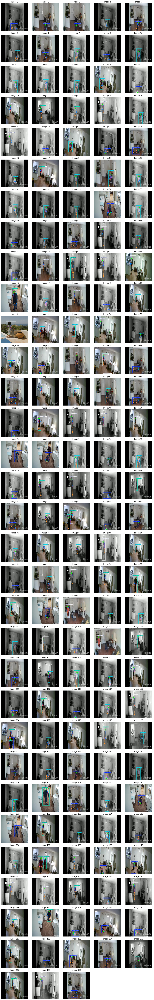

In [18]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Plot prediction on test images

# Specify the predict folder path
pred_path = '/content/runs/pose/predict'

# List all images in the predict folder
pred_image_files = [os.path.join(pred_path, img) for img in os.listdir(pred_path) if img.endswith(('.jpg', '.jpeg', '.png'))]

# Number of images per row
images_per_row = 5

# Calculate the number of rows needed
n_rows = len(pred_image_files) // images_per_row + int(len(pred_image_files) % images_per_row != 0)

# Set figure size
fig, axs = plt.subplots(n_rows, images_per_row, figsize=(15, 3 * n_rows))

# Flatten axes if necessary (for easier iteration)
axs = axs.flatten()

# Loop through each image and display it
for i, img_path in enumerate(pred_image_files):
    img = mpimg.imread(img_path)      # Read the image
    axs[i].imshow(img)                # Show the image
    axs[i].axis('off')                # Turn off axis
    axs[i].set_title(f"Image {i+1}")  # Add title

# Hide any extra empty subplots (if the number of images is not a perfect multiple of images_per_row)
for j in range(i+1, len(axs)):
    axs[j].axis('off')  # Hide unused axes

# Display all images
plt.tight_layout()
plt.show()

In [19]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [21]:
# download a sample video file
!gdown "https://drive.google.com/uc?id=19jREqMUWoJgixJgwgeHvvsPu82neJITp&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=19jREqMUWoJgixJgwgeHvvsPu82neJITp&confirm=t
To: /content/video1.mp4
100% 1.40M/1.40M [00:00<00:00, 147MB/s]


In [26]:
# run the model on the sample video file
results = model.predict(source="/content/video1.mp4", save=True, conf=0.25, iou=0.25)


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/272) /content/video1.mp4: 384x640 (no detections), 384.4ms
video 1/1 (frame 2/272) /content/video1.mp4: 384x640 (no detections), 348.8ms
video 1/1 (frame 3/272) /content/video1.mp4: 384x640 (no detections), 368.2ms
video 1/1 (frame 4/272) /content/video1.mp4: 384x640 (no detections), 377.3ms
video 1/1 (frame 5/272) /content/video1.mp4: 384x640 (no detections), 351.1ms
video 1/1 (frame 6/272) /content/video1.mp4: 384x640 (no detection

In [27]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/runs/pose/predict/video1.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)